## **Data Import**

In [ ]:
# Goal is to predict students that are currently active but likely to drop in the future
# Dataset is anonymous to meet FERPA requirements

import pandas as pd

df = pd.read_csv('/content/drive/MyDrive/Data/student_enrollment_sample.csv')
print(df.shape)
df.head()

(50001, 35)


,EXPECTED_START_DATE,GRADUATION_DATE,ENROLL_COUNT,NUMBER_AVERAGE,MINUTES_ATTENDED,HOURS_ATTEMPTED,HOURS_EARNED,AR_BALANCE_AMOUNT,MINUTES_ABSENT,DAYS_ABSENT,MINUTES_MAKEUP,REENTRY_NUMBER,PROGRAM_GROUP,BIRTH_DATE,LAST_ACTIVITY_DATE,MOD_NUMBER,COHORT_YEAR,CUMMULATIVE_GPA,CUMMULATIVE_GPA_POINTS,CUMMULATIVE_GPA_CREDITS,AR_BALANCE,ENROLLMENT_GPA,CREDITS_ATTEMPTED,CREDITS_EARNED,CREDITS_REQUIRED,CREDITS_LEFT,ENROLLMENT_COUNT,MODS_ATTENDED_COUNT,HS_GRADUATED_FLAG,DISABLED_FLAG,HISPANIC_FLAG,VETERAN_FLAG,STATUS_DESCRIPTION,IN_SCHOOL_FLAG,SIMPLE_STATUS_DESCRIPTION
0,NaN,NaN,1.0,0.0,NaN,0.0,0.0,0.0,NaN,0.0,NaN,0.0,unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Application Cancelled,0.0,Other
1,NaN,2/8/2016,1.0,0.0,NaN,0.0,0.0,0.0,NaN,0.0,NaN,0.0,unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Applicant,0.0,Other
2,NaN,NaN,1.0,0.0,NaN,0.0,0.0,0.0,NaN,0.0,NaN,0.0,HSHIB,11/7/1961,10/10/2014,11.0,2020.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,180.0,180.0,2.0,0.0,0.0,0.0,0.0,0.0,Pending Applicant - Portal Only,0.0,Other
3,NaN,NaN,1.0,0.0,NaN,0.0,0.0,0.0,NaN,0.0,NaN,0.0,BUBAM,1/4/1987,2/25/2015,1.0,2017.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,60.0,60.0,3.0,0.0,0.0,0.0,1.0,0.0,Applicant,0.0,Other
4,NaN,NaN,1.0,0.0,NaN,0.0,0.0,0.0,NaN,0.0,NaN,0.0,unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Pending Applicant - Portal Only,0.0,Other


# **Two-Class Modeling**

## **Data Cleaning**

### Missing Values

In [ ]:
# Print out a list of missing values for each column in the dataset 

df.isna().sum()

EXPECTED_START_DATE           1871
GRADUATION_DATE               1598
ENROLL_COUNT                     1
NUMBER_AVERAGE                   1
MINUTES_ATTENDED             16287
HOURS_ATTEMPTED                  1
HOURS_EARNED                     1
AR_BALANCE_AMOUNT                1
MINUTES_ABSENT               16297
DAYS_ABSENT                      1
MINUTES_MAKEUP               16297
REENTRY_NUMBER                   1
PROGRAM_GROUP                   14
BIRTH_DATE                    1361
LAST_ACTIVITY_DATE            4388
MOD_NUMBER                    1324
COHORT_YEAR                   1375
CUMMULATIVE_GPA              15550
CUMMULATIVE_GPA_POINTS       37157
CUMMULATIVE_GPA_CREDITS      37157
AR_BALANCE                    1323
ENROLLMENT_GPA                1322
CREDITS_ATTEMPTED             1323
CREDITS_EARNED                1323
CREDITS_REQUIRED              1336
CREDITS_LEFT                  1336
ENROLLMENT_COUNT              1323
MODS_ATTENDED_COUNT           1323
HS_GRADUATED_FLAG   

In [ ]:
# Create new dataframe and remove any column that is missing over 30%
# of the records. Print summary of missing values for remaining columns.

df_nomissing = df.copy()

for col in df:
  if (df_nomissing[col].isna().sum() / len(df_nomissing)) > .3:
    df_nomissing.drop(columns=[col], inplace=True)

df_nomissing.isna().sum() / len(df_nomissing)

EXPECTED_START_DATE          0.037419
GRADUATION_DATE              0.031959
ENROLL_COUNT                 0.000020
NUMBER_AVERAGE               0.000020
HOURS_ATTEMPTED              0.000020
HOURS_EARNED                 0.000020
AR_BALANCE_AMOUNT            0.000020
DAYS_ABSENT                  0.000020
REENTRY_NUMBER               0.000020
PROGRAM_GROUP                0.000280
BIRTH_DATE                   0.027219
LAST_ACTIVITY_DATE           0.087758
MOD_NUMBER                   0.026479
COHORT_YEAR                  0.027499
AR_BALANCE                   0.026459
ENROLLMENT_GPA               0.026439
CREDITS_ATTEMPTED            0.026459
CREDITS_EARNED               0.026459
CREDITS_REQUIRED             0.026719
CREDITS_LEFT                 0.026719
ENROLLMENT_COUNT             0.026459
MODS_ATTENDED_COUNT          0.026459
HS_GRADUATED_FLAG            0.026459
DISABLED_FLAG                0.026459
HISPANIC_FLAG                0.026459
VETERAN_FLAG                 0.026459
STATUS_DESCR

In [ ]:
# Drop all remaining rows that contain missing data.
# Print out the number of rows and columns in the remaining dataset.

df_nomissing.dropna(inplace=True)
df_nomissing.shape

(44965, 29)

### Handle Dates

In [ ]:
# Replace date values with the number of days between it and 2022-1-1. 
# Replace graduation date with the number of days until graduation (Assume today is 2020-1-1)

from datetime import datetime as dt

df_dates = df_nomissing.copy()

df_dates['LAST_ACTIVITY_DATE'] = pd.to_datetime(df_dates['LAST_ACTIVITY_DATE']).dt.date
df_dates['EXPECTED_START_DATE'] = pd.to_datetime(df_dates['EXPECTED_START_DATE']).dt.date
df_dates['BIRTH_DATE'] = pd.to_datetime(df_dates['BIRTH_DATE']).dt.date
df_dates['GRADUATION_DATE'] = pd.to_datetime(df_dates['GRADUATION_DATE']).dt.date

df_dates['LAST_ACTIVITY_DATE'] = (dt.strptime("2022-1-1", '%Y-%m-%d').date() - df_dates['LAST_ACTIVITY_DATE']).dt.days
df_dates['EXPECTED_START_DATE'] = (dt.strptime("2022-1-1", '%Y-%m-%d').date() - df_dates['EXPECTED_START_DATE']).dt.days
df_dates['BIRTH_DATE'] = (dt.strptime("2022-1-1", '%Y-%m-%d').date() - df_dates['BIRTH_DATE']).dt.days
df_dates['GRADUATION_DATE'] = (df_dates['GRADUATION_DATE'] - dt.strptime("2020-1-1", '%Y-%m-%d').date()).dt.days

df_dates.head()

,EXPECTED_START_DATE,GRADUATION_DATE,ENROLL_COUNT,NUMBER_AVERAGE,HOURS_ATTEMPTED,HOURS_EARNED,AR_BALANCE_AMOUNT,DAYS_ABSENT,REENTRY_NUMBER,PROGRAM_GROUP,BIRTH_DATE,LAST_ACTIVITY_DATE,MOD_NUMBER,COHORT_YEAR,AR_BALANCE,ENROLLMENT_GPA,CREDITS_ATTEMPTED,CREDITS_EARNED,CREDITS_REQUIRED,CREDITS_LEFT,ENROLLMENT_COUNT,MODS_ATTENDED_COUNT,HS_GRADUATED_FLAG,DISABLED_FLAG,HISPANIC_FLAG,VETERAN_FLAG,STATUS_DESCRIPTION,IN_SCHOOL_FLAG,SIMPLE_STATUS_DESCRIPTION
1873,236,1572,1.0,0.0,0.0,0.0,0.0,0.0,0.0,GAGAB,12991,262,5.0,2026.0,0.0,0.0,0.0,0.0,183.0,183.0,2.0,1.0,0.0,0.0,0.0,0.0,Future Start,0.0,Other
1874,236,1544,1.0,0.0,0.0,0.0,0.0,0.0,0.0,BUBAB,236,263,5.0,2026.0,0.0,0.0,0.0,0.0,180.0,180.0,1.0,0.0,0.0,0.0,0.0,0.0,Applicant,0.0,Other
1875,236,1544,1.0,0.0,0.0,0.0,0.0,0.0,0.0,BUBAB,15512,262,5.0,2026.0,0.0,0.0,0.0,0.0,180.0,180.0,1.0,0.0,0.0,0.0,0.0,0.0,Applicant,0.0,Other
1876,236,1040,1.0,0.0,0.0,0.0,0.0,0.0,0.0,MSMAA,7221,262,5.0,2024.0,0.0,0.0,0.0,0.0,95.0,95.0,1.0,1.0,0.0,0.0,0.0,0.0,Future Start,0.0,Other
1878,236,1040,1.0,0.0,0.0,0.0,0.0,0.0,0.0,MSMAA,7298,262,5.0,2024.0,0.0,0.0,0.0,0.0,95.0,95.0,1.0,0.0,0.0,0.0,0.0,0.0,Applicant,0.0,Other


### Bin Categorical Values

In [ ]:
# Bin program groups that are smaller than 5% into "Other"

print(df_dates.PROGRAM_GROUP.value_counts() / len(df_dates))

for row in df_dates.itertuples():
  if row[10] not in ['GAGAB', 'MSMAA', 'HSHMB', 'CSSMB', 'CSCNB', 'BUBAB']:
    df_dates.at[row[0], 'PROGRAM_GROUP'] = 'Other'

print(df_dates.PROGRAM_GROUP.value_counts() / len(df_dates))

GAGAB    0.282220
MSMAA    0.238341
HSHMB    0.140576
CSSMB    0.102791
CSCNB    0.099944
BUBAB    0.097209
GAWDB    0.020282
ACACB    0.009986
RTRCB    0.001979
BUBUA    0.001623
CSISM    0.001179
NUNUB    0.000912
MSMSA    0.000801
BUBUD    0.000512
HSSTA    0.000378
CSCNA    0.000334
RTRTA    0.000267
NUNEA    0.000156
GAGAA    0.000133
BUBMA    0.000133
NUNAM    0.000111
BUBAM    0.000044
CSNIB    0.000022
HSHAM    0.000022
NUNEM    0.000022
HSPHM    0.000022
Name: PROGRAM_GROUP, dtype: float64
GAGAB    0.282220
MSMAA    0.238341
HSHMB    0.140576
CSSMB    0.102791
CSCNB    0.099944
BUBAB    0.097209
Other    0.038919
Name: PROGRAM_GROUP, dtype: float64


### Relabel Label

In [ ]:
# Change in school flag and simple status description for those who have graduated

df_ready = df_dates.copy()

df_ready.loc[df_ready['STATUS_DESCRIPTION'] == 'Graduate', 'IN_SCHOOL_FLAG'] = 1
df_ready.loc[df_ready['STATUS_DESCRIPTION'] == 'Graduate', 'SIMPLE_STATUS_DESCRIPTION'] = 'Active'

## **Classification Modeling**

### Dummy Coding

In [ ]:
# change Mod Number and Cohort Year to objects since they represent categorical values
# drop status description and simple status description which are alternative labels

from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier

df_dummies = df_ready.copy()

df_dummies.MOD_NUMBER = df_dummies.MOD_NUMBER.astype('object')
df_dummies.COHORT_YEAR = df_dummies.COHORT_YEAR.astype('object')

df_dummies.drop(columns=['STATUS_DESCRIPTION', 'SIMPLE_STATUS_DESCRIPTION'], inplace=True)

# create dummy variables for remaining categorical features

for col in df_dummies:
  if not pd.api.types.is_numeric_dtype(df_dummies[col]):
    df_dummies = pd.get_dummies(df_dummies, columns=[col], drop_first=True)

df_dummies.head()

,EXPECTED_START_DATE,GRADUATION_DATE,ENROLL_COUNT,NUMBER_AVERAGE,HOURS_ATTEMPTED,HOURS_EARNED,AR_BALANCE_AMOUNT,DAYS_ABSENT,REENTRY_NUMBER,BIRTH_DATE,LAST_ACTIVITY_DATE,AR_BALANCE,ENROLLMENT_GPA,CREDITS_ATTEMPTED,CREDITS_EARNED,CREDITS_REQUIRED,CREDITS_LEFT,ENROLLMENT_COUNT,MODS_ATTENDED_COUNT,HS_GRADUATED_FLAG,DISABLED_FLAG,HISPANIC_FLAG,VETERAN_FLAG,IN_SCHOOL_FLAG,PROGRAM_GROUP_CSCNB,PROGRAM_GROUP_CSSMB,PROGRAM_GROUP_GAGAB,PROGRAM_GROUP_HSHMB,PROGRAM_GROUP_MSMAA,PROGRAM_GROUP_Other,MOD_NUMBER_2.0,MOD_NUMBER_3.0,MOD_NUMBER_4.0,MOD_NUMBER_5.0,MOD_NUMBER_7.0,MOD_NUMBER_8.0,MOD_NUMBER_9.0,MOD_NUMBER_10.0,MOD_NUMBER_11.0,MOD_NUMBER_12.0,MOD_NUMBER_13.0,COHORT_YEAR_2023.0,COHORT_YEAR_2024.0,COHORT_YEAR_2025.0,COHORT_YEAR_2026.0
1873,236,1572,1.0,0.0,0.0,0.0,0.0,0.0,0.0,12991,262,0.0,0.0,0.0,0.0,183.0,183.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1
1874,236,1544,1.0,0.0,0.0,0.0,0.0,0.0,0.0,236,263,0.0,0.0,0.0,0.0,180.0,180.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1
1875,236,1544,1.0,0.0,0.0,0.0,0.0,0.0,0.0,15512,262,0.0,0.0,0.0,0.0,180.0,180.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1
1876,236,1040,1.0,0.0,0.0,0.0,0.0,0.0,0.0,7221,262,0.0,0.0,0.0,0.0,95.0,95.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
1878,236,1040,1.0,0.0,0.0,0.0,0.0,0.0,0.0,7298,262,0.0,0.0,0.0,0.0,95.0,95.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0


### Select Label and Features

In [ ]:
# Set the y and X variables to represent the label and feature set.

y = df_dummies.IN_SCHOOL_FLAG
X = df_dummies.drop(columns=['IN_SCHOOL_FLAG'])
X.head()

,EXPECTED_START_DATE,GRADUATION_DATE,ENROLL_COUNT,NUMBER_AVERAGE,HOURS_ATTEMPTED,HOURS_EARNED,AR_BALANCE_AMOUNT,DAYS_ABSENT,REENTRY_NUMBER,BIRTH_DATE,LAST_ACTIVITY_DATE,AR_BALANCE,ENROLLMENT_GPA,CREDITS_ATTEMPTED,CREDITS_EARNED,CREDITS_REQUIRED,CREDITS_LEFT,ENROLLMENT_COUNT,MODS_ATTENDED_COUNT,HS_GRADUATED_FLAG,DISABLED_FLAG,HISPANIC_FLAG,VETERAN_FLAG,PROGRAM_GROUP_CSCNB,PROGRAM_GROUP_CSSMB,PROGRAM_GROUP_GAGAB,PROGRAM_GROUP_HSHMB,PROGRAM_GROUP_MSMAA,PROGRAM_GROUP_Other,MOD_NUMBER_2.0,MOD_NUMBER_3.0,MOD_NUMBER_4.0,MOD_NUMBER_5.0,MOD_NUMBER_7.0,MOD_NUMBER_8.0,MOD_NUMBER_9.0,MOD_NUMBER_10.0,MOD_NUMBER_11.0,MOD_NUMBER_12.0,MOD_NUMBER_13.0,COHORT_YEAR_2023.0,COHORT_YEAR_2024.0,COHORT_YEAR_2025.0,COHORT_YEAR_2026.0
1873,236,1572,1.0,0.0,0.0,0.0,0.0,0.0,0.0,12991,262,0.0,0.0,0.0,0.0,183.0,183.0,2.0,1.0,0.0,0.0,0.0,0.0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1
1874,236,1544,1.0,0.0,0.0,0.0,0.0,0.0,0.0,236,263,0.0,0.0,0.0,0.0,180.0,180.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1
1875,236,1544,1.0,0.0,0.0,0.0,0.0,0.0,0.0,15512,262,0.0,0.0,0.0,0.0,180.0,180.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1
1876,236,1040,1.0,0.0,0.0,0.0,0.0,0.0,0.0,7221,262,0.0,0.0,0.0,0.0,95.0,95.0,1.0,1.0,0.0,0.0,0.0,0.0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
1878,236,1040,1.0,0.0,0.0,0.0,0.0,0.0,0.0,7298,262,0.0,0.0,0.0,0.0,95.0,95.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0


### Split Data

In [ ]:
# Split the y and X sets into training and testing sets.
# Use a 70/30 split meaning 70% training data, 30% testing data

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.3, random_state=12345)
X_test.head()

,EXPECTED_START_DATE,GRADUATION_DATE,ENROLL_COUNT,NUMBER_AVERAGE,HOURS_ATTEMPTED,HOURS_EARNED,AR_BALANCE_AMOUNT,DAYS_ABSENT,REENTRY_NUMBER,BIRTH_DATE,LAST_ACTIVITY_DATE,AR_BALANCE,ENROLLMENT_GPA,CREDITS_ATTEMPTED,CREDITS_EARNED,CREDITS_REQUIRED,CREDITS_LEFT,ENROLLMENT_COUNT,MODS_ATTENDED_COUNT,HS_GRADUATED_FLAG,DISABLED_FLAG,HISPANIC_FLAG,VETERAN_FLAG,PROGRAM_GROUP_CSCNB,PROGRAM_GROUP_CSSMB,PROGRAM_GROUP_GAGAB,PROGRAM_GROUP_HSHMB,PROGRAM_GROUP_MSMAA,PROGRAM_GROUP_Other,MOD_NUMBER_2.0,MOD_NUMBER_3.0,MOD_NUMBER_4.0,MOD_NUMBER_5.0,MOD_NUMBER_7.0,MOD_NUMBER_8.0,MOD_NUMBER_9.0,MOD_NUMBER_10.0,MOD_NUMBER_11.0,MOD_NUMBER_12.0,MOD_NUMBER_13.0,COHORT_YEAR_2023.0,COHORT_YEAR_2024.0,COHORT_YEAR_2025.0,COHORT_YEAR_2026.0
2148,236,1544,1.0,0.000000,0.0,0.0,0.0,0.0,0.0,7079,263,0.0,0.00,0.0,0.0,180.5,180.5,1.0,0.0,0.0,0.0,1.0,0.0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1
22511,390,1390,1.0,0.000000,0.0,0.0,0.0,0.0,0.0,9812,361,0.0,0.00,0.0,0.0,180.5,180.5,1.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
45412,530,1250,1.0,0.000000,0.0,0.0,0.0,0.0,0.0,12352,557,0.0,0.00,0.0,0.0,180.0,180.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
16742,348,606,1.0,99.468553,1790.0,1790.0,-75.0,0.0,0.0,9701,270,-249.0,3.99,159.0,159.0,180.0,21.0,2.0,47.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
7689,292,984,1.0,0.000000,0.0,0.0,0.0,0.0,0.0,13273,310,0.0,0.00,0.0,0.0,95.0,95.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0


### Create Classifier and Fit Model

In [ ]:
# Create and fit a DecisionTreeClassifier() model using the 
# training datasets.

clf = DecisionTreeClassifier().fit(X_train, y_train)

### Compare Actual Versus Predicted Values

In [ ]:
# Generate predictions for the testing dataset
# Add actual and predicted values to a new DataFrame

y_pred = clf.predict(X_test)

pd.DataFrame({'Actual':y_test, 'Predicted':y_pred}).head(10)

,Actual,Predicted
2148,0.0,0.0
22511,0.0,0.0
45412,0.0,0.0
16742,1.0,1.0
7689,0.0,0.0
22725,0.0,0.0
26189,0.0,0.0
39307,0.0,0.0
48033,0.0,0.0
23015,0.0,0.0


### Assess Model Fit/Quality/Accuracy

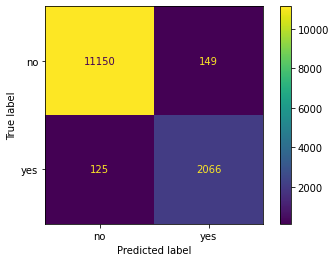

In [ ]:
# Generate a confusion matrix for the results

from sklearn import metrics

from matplotlib import pyplot as plt
cm = metrics.confusion_matrix(y_test, y_pred)
cm_display = metrics.ConfusionMatrixDisplay(cm, display_labels=['no', 'yes'])
cm_display.plot(values_format='d')
plt.show()

In [ ]:
# Generate the accuracy, precision, recall, and f1 scores for the predictions

y_test_dummies = pd.get_dummies(y_test)
y_pred_dummies = pd.get_dummies(y_pred)
  
print(f"Accuracy:\t{metrics.accuracy_score(y_test, y_pred)}")

print(f"Precision:\t{metrics.precision_score(y_test_dummies[1.0], y_pred_dummies[1.0], labels=['no', 'yes'])}")
 
print(f"Recall:\t\t{metrics.recall_score(y_test_dummies[1.0], y_pred_dummies[1.0], labels=['no', 'yes'])}")

print(f"F1:\t\t{metrics.f1_score(y_test_dummies[1.0], y_pred_dummies[1.0], labels=['no', 'yes'])}")

Accuracy:	0.9796886582653818
Precision:	0.9327313769751693
Recall:		0.9429484253765404
F1:		0.93781207444394


### Visualize Classification Model

In [ ]:
# Generate a tree visualization using export_graphviz. 

from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO
from IPython.display import Image
import pydotplus, six
  
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data, filled=True, rounded=True, special_characters=True, feature_names = X.columns,class_names=['no', 'yes'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('tree.png')
Image(graph.create_png())

/usr/local/lib/python3.7/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


# **Multi-Class Modeling**

## **Data Cleaning**

### Combine or Eliminate Low Frequency Values

In [ ]:
# Rather than predicting in school flag, predict if the student is active, probation, or terminated
# Print the number of each combination of status description, in school flag, and simple status description

df_ready.groupby(['STATUS_DESCRIPTION', 'IN_SCHOOL_FLAG', 'SIMPLE_STATUS_DESCRIPTION'])['ENROLL_COUNT'].count()

STATUS_DESCRIPTION           IN_SCHOOL_FLAG  SIMPLE_STATUS_DESCRIPTION
Active                       1.0             Active                        6585
Active-Pre Grad              1.0             Active                         287
Applicant                    0.0             Other                         1484
Application Cancelled        0.0             Other                         9883
Cancel                       0.0             Terminated                    1633
Dismissed                    0.0             Terminated                     203
Drop                         0.0             Terminated                    1562
False Re-Enter               0.0             Terminated                     460
False Start                  0.0             Terminated                    4074
Future Start                 0.0             Other                          876
Graduate                     1.0             Active                         317
NDS-Complete                 0.0             Othe

In [ ]:
# Get rid of students whose simple status description is "Other"

df_ready.drop(df_ready[df_ready['SIMPLE_STATUS_DESCRIPTION'] == 'Other'].index, inplace = True)
df_ready.groupby(['STATUS_DESCRIPTION', 'IN_SCHOOL_FLAG', 'SIMPLE_STATUS_DESCRIPTION'])['ENROLL_COUNT'].count()

STATUS_DESCRIPTION         IN_SCHOOL_FLAG  SIMPLE_STATUS_DESCRIPTION
Active                     1.0             Active                        6585
Active-Pre Grad            1.0             Active                         287
Cancel                     0.0             Terminated                    1633
Dismissed                  0.0             Terminated                     203
Drop                       0.0             Terminated                    1562
False Re-Enter             0.0             Terminated                     460
False Start                0.0             Terminated                    4074
Graduate                   1.0             Active                         317
No Show                    0.0             Terminated                   17229
Probation                  1.0             Active                         224
Transfer To Other Program  0.0             Terminated                      53
Name: ENROLL_COUNT, dtype: int64

In [ ]:
# Get rid of students that transferred, were a no show, or a false start (these entries aren't relevant)

df_ready.drop(df_ready[df_ready['STATUS_DESCRIPTION'] == 'Transfer To Other Program'].index, inplace = True)
df_ready.drop(df_ready[df_ready['STATUS_DESCRIPTION'] == 'No Show'].index, inplace = True)
df_ready.drop(df_ready[df_ready['STATUS_DESCRIPTION'] == 'False Start'].index, inplace = True)
df_ready.groupby(['STATUS_DESCRIPTION', 'IN_SCHOOL_FLAG', 'SIMPLE_STATUS_DESCRIPTION'])['ENROLL_COUNT'].count()

STATUS_DESCRIPTION  IN_SCHOOL_FLAG  SIMPLE_STATUS_DESCRIPTION
Active              1.0             Active                       6585
Active-Pre Grad     1.0             Active                        287
Cancel              0.0             Terminated                   1633
Dismissed           0.0             Terminated                    203
Drop                0.0             Terminated                   1562
False Re-Enter      0.0             Terminated                    460
Graduate            1.0             Active                        317
Probation           1.0             Active                        224
Name: ENROLL_COUNT, dtype: int64

In [ ]:
# Relabel the simple status description for those with status description of probation, to probation

df_ready.loc[df_ready['STATUS_DESCRIPTION'] == 'Probation', 'SIMPLE_STATUS_DESCRIPTION'] = 'Probation'
df_ready.groupby(['STATUS_DESCRIPTION', 'IN_SCHOOL_FLAG', 'SIMPLE_STATUS_DESCRIPTION'])['ENROLL_COUNT'].count()

STATUS_DESCRIPTION  IN_SCHOOL_FLAG  SIMPLE_STATUS_DESCRIPTION
Active              1.0             Active                       6585
Active-Pre Grad     1.0             Active                        287
Cancel              0.0             Terminated                   1633
Dismissed           0.0             Terminated                    203
Drop                0.0             Terminated                   1562
False Re-Enter      0.0             Terminated                    460
Graduate            1.0             Active                        317
Probation           1.0             Probation                     224
Name: ENROLL_COUNT, dtype: int64

## **Classification Modeling**

### Dummy Codes

In [ ]:
# change Mod Number and Cohort Year to objects since they represent categorical values
# drop status description and in school flag which are alternative labels 

df_new_dummies = df_ready.copy()

df_new_dummies['MOD_NUMBER'] = df_new_dummies['MOD_NUMBER'].astype(object)
df_new_dummies['COHORT_YEAR'] = df_new_dummies['COHORT_YEAR'].astype(object)

df_new_dummies.drop(columns=['STATUS_DESCRIPTION', 'IN_SCHOOL_FLAG'], inplace=True)

# Generate dummy variables for remaining categorial features

for col in df_new_dummies.columns:
  if col != 'SIMPLE_STATUS_DESCRIPTION':
    if not pd.api.types.is_numeric_dtype(df_new_dummies[col]):
      df_new_dummies = pd.get_dummies(df_new_dummies, columns=[col], prefix=col)

df_new_dummies.head()

,EXPECTED_START_DATE,GRADUATION_DATE,ENROLL_COUNT,NUMBER_AVERAGE,HOURS_ATTEMPTED,HOURS_EARNED,AR_BALANCE_AMOUNT,DAYS_ABSENT,REENTRY_NUMBER,BIRTH_DATE,LAST_ACTIVITY_DATE,AR_BALANCE,ENROLLMENT_GPA,CREDITS_ATTEMPTED,CREDITS_EARNED,CREDITS_REQUIRED,CREDITS_LEFT,ENROLLMENT_COUNT,MODS_ATTENDED_COUNT,HS_GRADUATED_FLAG,DISABLED_FLAG,HISPANIC_FLAG,VETERAN_FLAG,SIMPLE_STATUS_DESCRIPTION,PROGRAM_GROUP_BUBAB,PROGRAM_GROUP_CSCNB,PROGRAM_GROUP_CSSMB,PROGRAM_GROUP_GAGAB,PROGRAM_GROUP_HSHMB,PROGRAM_GROUP_MSMAA,PROGRAM_GROUP_Other,MOD_NUMBER_1.0,MOD_NUMBER_2.0,MOD_NUMBER_3.0,MOD_NUMBER_4.0,MOD_NUMBER_5.0,MOD_NUMBER_7.0,MOD_NUMBER_8.0,MOD_NUMBER_9.0,MOD_NUMBER_10.0,MOD_NUMBER_11.0,MOD_NUMBER_12.0,MOD_NUMBER_13.0,COHORT_YEAR_2022.0,COHORT_YEAR_2023.0,COHORT_YEAR_2024.0,COHORT_YEAR_2025.0,COHORT_YEAR_2026.0
3274,264,1012,1.0,0.000000,0.0,0.0,9040.0,0.0,0.0,10429,263,9040.0,0.00,0.0,0.0,95.0,95.0,2.0,5.0,0.0,0.0,0.0,0.0,Active,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
3275,264,1544,1.0,0.000000,0.0,0.0,8160.0,0.0,0.0,10920,271,8160.0,0.00,0.0,0.0,183.0,183.0,1.0,5.0,0.0,0.0,1.0,0.0,Active,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1
3280,264,956,1.0,85.130435,120.0,120.0,9040.0,0.0,0.0,7914,282,10792.0,3.11,11.5,11.5,95.0,83.5,6.0,16.0,0.0,0.0,0.0,0.0,Active,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
3282,264,1012,1.0,0.000000,0.0,0.0,9040.0,0.0,0.0,7604,282,9040.0,0.00,0.0,0.0,95.0,95.0,2.0,5.0,0.0,0.0,0.0,0.0,Active,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
3293,264,1544,1.0,0.000000,0.0,0.0,8160.0,0.0,0.0,13462,284,8160.0,0.00,0.0,0.0,183.0,183.0,2.0,5.0,0.0,0.0,0.0,0.0,Active,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1


### Select Label and Features

In [ ]:
# Create the y and X variables for the label and features

import numpy as np

y = df_new_dummies.SIMPLE_STATUS_DESCRIPTION
X = df_new_dummies.drop(columns=['SIMPLE_STATUS_DESCRIPTION'])
X = X.select_dtypes(np.number)
X.head()

,EXPECTED_START_DATE,GRADUATION_DATE,ENROLL_COUNT,NUMBER_AVERAGE,HOURS_ATTEMPTED,HOURS_EARNED,AR_BALANCE_AMOUNT,DAYS_ABSENT,REENTRY_NUMBER,BIRTH_DATE,LAST_ACTIVITY_DATE,AR_BALANCE,ENROLLMENT_GPA,CREDITS_ATTEMPTED,CREDITS_EARNED,CREDITS_REQUIRED,CREDITS_LEFT,ENROLLMENT_COUNT,MODS_ATTENDED_COUNT,HS_GRADUATED_FLAG,DISABLED_FLAG,HISPANIC_FLAG,VETERAN_FLAG,PROGRAM_GROUP_BUBAB,PROGRAM_GROUP_CSCNB,PROGRAM_GROUP_CSSMB,PROGRAM_GROUP_GAGAB,PROGRAM_GROUP_HSHMB,PROGRAM_GROUP_MSMAA,PROGRAM_GROUP_Other,MOD_NUMBER_1.0,MOD_NUMBER_2.0,MOD_NUMBER_3.0,MOD_NUMBER_4.0,MOD_NUMBER_5.0,MOD_NUMBER_7.0,MOD_NUMBER_8.0,MOD_NUMBER_9.0,MOD_NUMBER_10.0,MOD_NUMBER_11.0,MOD_NUMBER_12.0,MOD_NUMBER_13.0,COHORT_YEAR_2022.0,COHORT_YEAR_2023.0,COHORT_YEAR_2024.0,COHORT_YEAR_2025.0,COHORT_YEAR_2026.0
3274,264,1012,1.0,0.000000,0.0,0.0,9040.0,0.0,0.0,10429,263,9040.0,0.00,0.0,0.0,95.0,95.0,2.0,5.0,0.0,0.0,0.0,0.0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
3275,264,1544,1.0,0.000000,0.0,0.0,8160.0,0.0,0.0,10920,271,8160.0,0.00,0.0,0.0,183.0,183.0,1.0,5.0,0.0,0.0,1.0,0.0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1
3280,264,956,1.0,85.130435,120.0,120.0,9040.0,0.0,0.0,7914,282,10792.0,3.11,11.5,11.5,95.0,83.5,6.0,16.0,0.0,0.0,0.0,0.0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
3282,264,1012,1.0,0.000000,0.0,0.0,9040.0,0.0,0.0,7604,282,9040.0,0.00,0.0,0.0,95.0,95.0,2.0,5.0,0.0,0.0,0.0,0.0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
3293,264,1544,1.0,0.000000,0.0,0.0,8160.0,0.0,0.0,13462,284,8160.0,0.00,0.0,0.0,183.0,183.0,2.0,5.0,0.0,0.0,0.0,0.0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1


### Split Data

In [ ]:
# Split the data using a 70/30 split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=12345)

### Create Classifier and Fit Model

In [ ]:
# Train a decision tree classifier model using the created dataset

clf = DecisionTreeClassifier()

clf = clf.fit(X_train,y_train)

### Compare Actual Versus Predicted Values

In [ ]:
# Generate predictions for the testing dataset
# Add actual and predicted values to a new DataFrame

y_pred = clf.predict(X_test)

output_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred,})
output_df.head(20)

,Actual,Predicted
17237,Active,Active
15035,Active,Active
18248,Terminated,Terminated
9492,Active,Active
46266,Probation,Terminated
3394,Active,Active
29770,Active,Terminated
41249,Terminated,Terminated
39809,Active,Active
20634,Active,Active


### Assess Model Fit/Quality/Accuracy

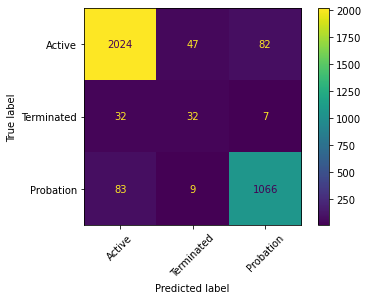

In [ ]:
# Generate a confusion matrix to view the results

from sklearn import metrics
from matplotlib import pyplot as plt

cm = metrics.confusion_matrix(y_test, y_pred)
cm_display = metrics.ConfusionMatrixDisplay(cm, ['Active', 'Terminated', 'Probation'])
cm_display.plot(values_format='d')
plt.xticks(rotation=45)
plt.show()

In [ ]:
# Generate the fit metrics (accuracy, precision, recall, f1)

y_test_dummies = pd.get_dummies(y_test)
y_pred_dummies = pd.get_dummies(y_pred)

report_dict = metrics.classification_report(y_test_dummies, y_pred_dummies, target_names=['Active', 'Terminated', 'Probation'], output_dict=True)
from sklearn.metrics import classification_report

df_report = pd.DataFrame(report_dict)
df_report

,Active,Terminated,Probation,micro avg,macro avg,weighted avg,samples avg
precision,0.946237,0.363636,0.922944,0.923122,0.744272,0.926030,0.923122
recall,0.940084,0.450704,0.920553,0.923122,0.770447,0.923122,0.923122
f1-score,0.943150,0.402516,0.921747,0.923122,0.755804,0.924472,0.923122
support,2153.000000,71.000000,1158.000000,3382.000000,3382.000000,3382.000000,3382.000000


### Visualize Classification Model

In [ ]:
# Generate a decision tree visualization using export_graphviz

from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus 

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data, filled=True, rounded=True, special_characters=True, feature_names = X.columns, class_names=['Active', 'Terminated', 'Probation'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('tree2.png')
Image(graph.create_png())